In [1]:
import pandas as pd
import numpy as np
import re
import json
import numpy as np
import timeit 
from datetime import datetime

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import ModelCheckpoint

In [3]:
# Cufflinks wrapper on plotly
import cufflinks
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

from plotly.offline import iplot
cufflinks.go_offline()

# Set global theme

import plotly.figure_factory as ff

import plotly.graph_objects as go
import plotly.express as px

In [176]:
import plotly.express as px
from shapely.geometry import Polygon, MultiPolygon
import geopandas as gpd
import matplotlib.pyplot as plt
import geojsoncontour

from scipy.interpolate import griddata
from numpy import linspace

In [4]:
from sklearn.model_selection import train_test_split

In [5]:
#Selecting a central city point to center all graphs around - Swietokrzyska Subway 
center_coors=52.235176, 21.008393

In [6]:
df=pd.read_excel("RE_models_input.xlsx")

In [7]:
df.columns

Index(['Id', 'Area', 'Price', 'latitude', 'longitude', 'build_year',
       'building_floors_num', 'rooms_num', 'City', 'subdistrict', 'market',
       'Building_material', 'Building_ownership', 'Building_type',
       'Construction_status', 'floor_no', 'Heating', 'Windows_type',
       'Equipment_types_dishwasher', 'Equipment_types_fridge',
       'Equipment_types_furniture', 'Equipment_types_oven',
       'Equipment_types_stove', 'Equipment_types_tv',
       'Equipment_types_washing_machine', 'Extras_types_air_conditioning',
       'Extras_types_attic', 'Extras_types_balcony', 'Extras_types_basement',
       'Extras_types_garage', 'Extras_types_garden', 'Extras_types_lift',
       'Extras_types_separate_kitchen', 'Extras_types_terrace',
       'Extras_types_two_storey', 'Extras_types_usable_room',
       'Media_types_cable-television', 'Media_types_electricity',
       'Media_types_internet', 'Media_types_phone', 'Media_types_sewage',
       'Media_types_water', 'Security_types_alarm

In [8]:
df['rooms_num']=np.where(df['rooms_num']=="more",10,df['rooms_num'])

In [9]:
df.drop(columns=['floor_no',"City","district_old",'price_decrease_from_20k','price_decrease_per_10min'],inplace=True)

In [10]:
df.columns

Index(['Id', 'Area', 'Price', 'latitude', 'longitude', 'build_year',
       'building_floors_num', 'rooms_num', 'subdistrict', 'market',
       'Building_material', 'Building_ownership', 'Building_type',
       'Construction_status', 'Heating', 'Windows_type',
       'Equipment_types_dishwasher', 'Equipment_types_fridge',
       'Equipment_types_furniture', 'Equipment_types_oven',
       'Equipment_types_stove', 'Equipment_types_tv',
       'Equipment_types_washing_machine', 'Extras_types_air_conditioning',
       'Extras_types_attic', 'Extras_types_balcony', 'Extras_types_basement',
       'Extras_types_garage', 'Extras_types_garden', 'Extras_types_lift',
       'Extras_types_separate_kitchen', 'Extras_types_terrace',
       'Extras_types_two_storey', 'Extras_types_usable_room',
       'Media_types_cable-television', 'Media_types_electricity',
       'Media_types_internet', 'Media_types_phone', 'Media_types_sewage',
       'Media_types_water', 'Security_types_alarm',
       'Security_

In [10]:
df["distance_driving"]=(df.distance_driving_8AM+df.distance_return_driving_5PM)/2
df["distance_transit"]=(df.distance_transit_8AM+df.distance_return_transit_5PM)/2
df["time_driving"]=(df.time_driving_8AM+df.time_return_driving_5PM)/2
df["time_transit"]=(df.time_return_transit_5PM+df.time_transit_8AM)/2

In [11]:
df.drop(columns=['distance_transit_8AM', 'time_transit_8AM', 'distance_driving_8AM',
       'time_driving_8AM', 'distance_return_transit_5PM',
       'time_return_transit_5PM', 'distance_return_driving_5PM',
       'time_return_driving_5PM'],inplace=True)

# Data exploration

## Category composition

In [12]:
unique_features=["district","market","Building_material","Building_ownership","Building_type","Construction_status","Heating",
"Windows_type"]

In [14]:
for feature in unique_features:
    feature_list=["Id"]
    feature_list.append(feature)

    df_temp=df[feature_list].groupby(feature, as_index=False).count()
    df_temp.rename(columns={"Id":"share"},inplace=True)
    df_temp.sort_values(by="share",inplace=True, ascending=False)
    df_temp["share"]=df_temp["share"]/df.shape[0]
    df_temp["share"]=np.around(df_temp["share"],3)*100
    df_temp["colour"]=np.where(df_temp[feature]=="not_specified","missing_data","valid_data")
    
    fig = px.bar(df_temp, x=feature, y='share', color="colour",
                 color_discrete_sequence=["blue", "red"],
                 category_orders={"colour": ["valid_data", "missing_data"]},)
    print("\n Feature summary for {} - Share of category within whole sample".format(feature))
    fig.show()
    print("----------------------------------------------------------------------------------------------------------------------------\n\n\n")

    


 Feature summary for district - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for market - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for Building_material - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for Building_ownership - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for Building_type - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for Construction_status - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for Heating - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------




 Feature summary for Windows_type - Share of category within whole sample


----------------------------------------------------------------------------------------------------------------------------





## Average unit price by feature 

In [15]:
for feature in unique_features:
    feature_list=["unit_price"]
    feature_list.append(feature)

    df_temp=df[feature_list]
    
    print("\n Unit price distribution in split by {}".format(feature))
    
    fig = fig = px.box(df_temp, y="unit_price", x=feature, points="suspectedoutliers");
    fig.update_yaxes(range=[5000, 25000])


    print("----------------------------------------------------------------------------------------------------------------------------\n\n\n")

    


 Unit price distribution in split by district


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by market


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by Building_material


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by Building_ownership


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by Building_type


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by Construction_status


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by Heating


----------------------------------------------------------------------------------------------------------------------------




 Unit price distribution in split by Windows_type


----------------------------------------------------------------------------------------------------------------------------





## Adding Eastern river bank feature

In [262]:
df.district.unique()

array(['Wola', 'Subburbs', 'Downtown', 'Ochota', 'Mokotow', 'Bialoleka',
       'Bielany', 'Bemowo', 'Southern Praga', 'Wilanow', 'Praga',
       'Ursynow', 'Zoliborz', 'Wlochy', 'Targowek', 'Wawer'], dtype=object)

In [264]:
east_bank_dict={
    'Wola':0,
    'Subburbs':0,
    'Downtown':0,
    'Ochota':0,
    'Mokotow':0,
    'Bialoleka':1,
    'Bielany':0,
    'Bemowo':0,
    'Southern Praga':1,
    'Wilanow':0,
    'Praga':1,
    'Ursynow':0,
    'Zoliborz':0,
    'Wlochy':0,
    'Targowek':1,
    'Wawer':1}

In [267]:
df["east_bank"]=df.district.apply(lambda x: east_bank_dict[x])

# Transforming data for ML models

In [269]:
from sklearn.preprocessing import OneHotEncoder

In [270]:
df_cat=df[unique_features]

In [271]:
enc=OneHotEncoder()
enc.fit(df_cat)

one_hot_val=enc.fit_transform(df_cat).toarray().astype(int)
one_hot_columns=enc.get_feature_names(unique_features)

OneHotEncoder(categories='auto', drop=None, dtype=<class 'numpy.float64'>,
              handle_unknown='error', sparse=True)

In [272]:
df_one_hot=pd.DataFrame(one_hot_val, columns=one_hot_columns)

In [273]:
df_one_hot.columns

Index(['district_Bemowo', 'district_Bialoleka', 'district_Bielany',
       'district_Downtown', 'district_Mokotow', 'district_Ochota',
       'district_Praga', 'district_Southern Praga', 'district_Subburbs',
       'district_Targowek', 'district_Ursynow', 'district_Wawer',
       'district_Wilanow', 'district_Wlochy', 'district_Wola',
       'district_Zoliborz', 'market_primary', 'market_secondary',
       'Building_material_breezeblock', 'Building_material_brick',
       'Building_material_cellular_concrete', 'Building_material_concrete',
       'Building_material_concrete_plate', 'Building_material_hydroton',
       'Building_material_not_specified', 'Building_material_other',
       'Building_material_reinforced_concrete', 'Building_material_silikat',
       'Building_material_wood', 'Building_ownership_co_operative_ownership',
       'Building_ownership_co_operative_ownership_with_a_land_and_mortgage_registe',
       'Building_ownership_full_ownership', 'Building_ownership_not_spec

In [274]:
not_specified_idx=[]
for i in range(0,df_one_hot.columns.shape[0]):
    if "not_specified" in df_one_hot.columns[i]:
        not_specified_idx.append(i)
not_specified_idx=np.asarray(not_specified_idx)

Let's drop all "not_specified" columns and secondary market in Mokotow district (it will be used as baseline in models)

In [275]:
drop_collinear_cols=list(df_one_hot.columns[not_specified_idx])
drop_collinear_cols.append('district_Mokotow')
drop_collinear_cols.append('market_secondary')

In [276]:
def list_diff(list1, list2):
    out = []
    for ele in list1:
        if not ele in list2:
            out.append(ele)
    return out

In [277]:
df_one_hot.columns

Index(['district_Bemowo', 'district_Bialoleka', 'district_Bielany',
       'district_Downtown', 'district_Mokotow', 'district_Ochota',
       'district_Praga', 'district_Southern Praga', 'district_Subburbs',
       'district_Targowek', 'district_Ursynow', 'district_Wawer',
       'district_Wilanow', 'district_Wlochy', 'district_Wola',
       'district_Zoliborz', 'market_primary', 'market_secondary',
       'Building_material_breezeblock', 'Building_material_brick',
       'Building_material_cellular_concrete', 'Building_material_concrete',
       'Building_material_concrete_plate', 'Building_material_hydroton',
       'Building_material_not_specified', 'Building_material_other',
       'Building_material_reinforced_concrete', 'Building_material_silikat',
       'Building_material_wood', 'Building_ownership_co_operative_ownership',
       'Building_ownership_co_operative_ownership_with_a_land_and_mortgage_registe',
       'Building_ownership_full_ownership', 'Building_ownership_not_spec

In [278]:
df_cat_columns=list_diff(df_one_hot.columns,drop_collinear_cols)

In [279]:
df_cat=df_one_hot[df_cat_columns]

In [280]:
columns_base=list_diff(df.columns, unique_features)

In [281]:
drop_columns_base=[
    'Price','latitude','longitude','lon_mod','lat_mod','grid_price','sample_size','City','subdistrict'
                  ]

In [282]:
columns_base=list_diff(columns_base, drop_columns_base)

In [283]:
df_base=df[columns_base]

In [284]:
df_base.columns

Index(['Id', 'Area', 'build_year', 'building_floors_num', 'rooms_num',
       'Equipment_types_dishwasher', 'Equipment_types_fridge',
       'Equipment_types_furniture', 'Equipment_types_oven',
       'Equipment_types_stove', 'Equipment_types_tv',
       'Equipment_types_washing_machine', 'Extras_types_air_conditioning',
       'Extras_types_attic', 'Extras_types_balcony', 'Extras_types_basement',
       'Extras_types_garage', 'Extras_types_garden', 'Extras_types_lift',
       'Extras_types_separate_kitchen', 'Extras_types_terrace',
       'Extras_types_two_storey', 'Extras_types_usable_room',
       'Media_types_cable-television', 'Media_types_electricity',
       'Media_types_internet', 'Media_types_phone', 'Media_types_sewage',
       'Media_types_water', 'Security_types_alarm',
       'Security_types_anti_burglary_door', 'Security_types_closed_area',
       'Security_types_entryphone', 'Security_types_monitoring',
       'Security_types_roller_shutters', 'floor_num', 'unit_price',


## Combining data for modeling

In [285]:
ml_data=pd.concat([df_base,df_cat],axis=1)

In [286]:
ml_data.shape

(11788, 90)

In [287]:
ml_data.head()

,Id,Area,build_year,building_floors_num,rooms_num,Equipment_types_dishwasher,Equipment_types_fridge,Equipment_types_furniture,Equipment_types_oven,Equipment_types_stove,...,Construction_status_to_completion,Construction_status_to_renovation,Heating_boiler_room,Heating_electrical,Heating_gas,Heating_other,Heating_urban,Windows_type_aluminium,Windows_type_plastic,Windows_type_wooden
0,60534950,80.10,2021,8,4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,60534789,52.27,2021,8,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,60534636,64.63,2021,8,3,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,60441425,46.86,2020,14,3,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,60225257,57.40,2019,11,3,1,1,1,1,1,...,0,0,0,0,0,0,1,0,1,0


In [288]:
ml_data.columns[:]

Index(['Id', 'Area', 'build_year', 'building_floors_num', 'rooms_num',
       'Equipment_types_dishwasher', 'Equipment_types_fridge',
       'Equipment_types_furniture', 'Equipment_types_oven',
       'Equipment_types_stove', 'Equipment_types_tv',
       'Equipment_types_washing_machine', 'Extras_types_air_conditioning',
       'Extras_types_attic', 'Extras_types_balcony', 'Extras_types_basement',
       'Extras_types_garage', 'Extras_types_garden', 'Extras_types_lift',
       'Extras_types_separate_kitchen', 'Extras_types_terrace',
       'Extras_types_two_storey', 'Extras_types_usable_room',
       'Media_types_cable-television', 'Media_types_electricity',
       'Media_types_internet', 'Media_types_phone', 'Media_types_sewage',
       'Media_types_water', 'Security_types_alarm',
       'Security_types_anti_burglary_door', 'Security_types_closed_area',
       'Security_types_entryphone', 'Security_types_monitoring',
       'Security_types_roller_shutters', 'floor_num', 'unit_price',


# Selecting best features

In [289]:
counts, bins = np.histogram(ml_data.unit_price, bins=range(0, 50000, 1000))
bins = bins[1:]

fig = px.bar(x=bins, y=counts, labels={'x':'Unit price', 'y':'count'})
fig.show()

In [290]:
X=ml_data.copy()
X=X.query("unit_price<=25000 and unit_price>5000")
y=X.unit_price
X.drop(columns=["unit_price","Id"],inplace=True)

In [291]:
from sklearn.feature_selection import SelectKBest, f_regression, chi2

In [292]:
bestfeatures = SelectKBest(score_func=f_regression, k="all")

In [293]:
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

In [294]:
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']

In [295]:
featureScores.nlargest(50,'Score')

,Specs,Score
35,distance_driving,6889.140723
36,distance_transit,6725.884253
38,time_transit,5360.201112
37,time_driving,4741.988679
43,district_Downtown,3516.937318
39,east_bank,1877.106960
41,district_Bialoleka,1766.097573
76,Building_type_tenement,769.001425
55,market_primary,701.343385
71,Building_type_block,629.435651


In [296]:
featureScores.query("Score>40").shape

(52, 2)

In [297]:
top_features=featureScores.nlargest(50,'Score').Specs.unique()

In [298]:
featureScores.sort_values(by="Score",inplace=True,ascending=False)

import plotly.express as px
fig = px.bar(featureScores, x='Specs', y='Score')
fig.show()

In [299]:
X=X[top_features]

## Spliting into train and test sets

In [357]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)


In [358]:
test_idx=np.asarray(X_test.index)

In [359]:
X_test_coors=df[[ "unit_price",'latitude', 'longitude',"lat_mod","lon_mod"]].iloc[test_idx]
X_test_coors.reset_index(inplace=True,drop=True)

In [360]:
df.columns

Index(['Id', 'Area', 'Price', 'latitude', 'longitude', 'build_year',
       'building_floors_num', 'rooms_num', 'subdistrict', 'market',
       'Building_material', 'Building_ownership', 'Building_type',
       'Construction_status', 'Heating', 'Windows_type',
       'Equipment_types_dishwasher', 'Equipment_types_fridge',
       'Equipment_types_furniture', 'Equipment_types_oven',
       'Equipment_types_stove', 'Equipment_types_tv',
       'Equipment_types_washing_machine', 'Extras_types_air_conditioning',
       'Extras_types_attic', 'Extras_types_balcony', 'Extras_types_basement',
       'Extras_types_garage', 'Extras_types_garden', 'Extras_types_lift',
       'Extras_types_separate_kitchen', 'Extras_types_terrace',
       'Extras_types_two_storey', 'Extras_types_usable_room',
       'Media_types_cable-television', 'Media_types_electricity',
       'Media_types_internet', 'Media_types_phone', 'Media_types_sewage',
       'Media_types_water', 'Security_types_alarm',
       'Security_

In [304]:
y_train.reset_index(drop=True,inplace=True)
y_test.reset_index(drop=True,inplace=True)

X_train.reset_index(drop=True,inplace=True)
X_test.reset_index(drop=True,inplace=True)

# Training initial model

In [305]:
from sklearn.ensemble import RandomForestRegressor

## Hyper parameters selection

In [306]:
param_grid = [
   
    
    { "bootstrap":[False],
     "n_estimators":[300],
     "max_features":[10,15,20,30],"max_depth":[10,15,20,25,30],"min_samples_leaf":[3,6,12],"min_samples_split":[6,12,24],
     "min_impurity_decrease":[0.01,0.03,0.1,0.3]
},
    
]

In [307]:
from sklearn.model_selection import GridSearchCV

In [308]:
forest_cl=RandomForestRegressor(random_state=10, n_jobs=2)

In [309]:
grid_search = GridSearchCV(forest_cl, param_grid, cv=4,
                          scoring="neg_mean_absolute_error",return_train_score=True)

In [310]:
#grid_search.fit(X_train, y_train)
#rf_clf_best_params = grid_search.best_estimator_


In [311]:
#grid_search.best_params_

In [312]:
#grid_search.best_params_.keys()

In [313]:
#rf_model=grid_search.best_estimator_

rf_model=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=20, max_features=30, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.01,
                      min_impurity_split=None, min_samples_leaf=3,
                      min_samples_split=6, min_weight_fraction_leaf=0.0,
                      n_estimators=300, n_jobs=2, oob_score=False,
                      random_state=10, verbose=0, warm_start=False)

In [314]:
rf_model.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=20, max_features=30, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.01,
                      min_impurity_split=None, min_samples_leaf=3,
                      min_samples_split=6, min_weight_fraction_leaf=0.0,
                      n_estimators=300, n_jobs=2, oob_score=False,
                      random_state=10, verbose=0, warm_start=False)

In [315]:
rf_model.score(X_train,y_train)

0.8924026295646735

In [316]:
rf_model.score(X_test,y_test)

0.7034453308536279

In [317]:
importance_df=pd.DataFrame(rf_model.feature_importances_,columns=["coefficients"])
importance_df["features"]=X.columns
importance_df.sort_values(by="coefficients",inplace=True)

In [318]:

trace0=go.Bar(
        x=importance_df.coefficients,
        y=importance_df.features,
        orientation="h",
        
        marker=dict(
        color="blue",

        opacity=0.5
        ),
       
    )








data=[trace0]
figure=go.Figure(
    data=data,
    layout=go.Layout(
        title="RF Classifier - Feature importance",
        xaxis=dict(title="Importance"),
        yaxis=dict(title="Feature")

    
    ))
iplot(figure)

In [319]:
def performance_summary(model, X_test, y_test ):
    
    y_hat=model.predict(X_test)
    
    df_summary=pd.DataFrame(y_hat, columns=["y_hat"])
    df_summary["y_true"]=y_test
    df_summary["abs_error"]=np.abs(df_summary.y_true-df_summary.y_hat)
    df_summary["error"]=df_summary.y_hat-df_summary.y_true
    df_summary["relative_error"]= df_summary["error"]/df_summary.y_true
    df_summary["relative_abs_error"]= df_summary["abs_error"]/df_summary.y_true
    
    print("Share of forecasts within 25% absolute error {:.3f}\n".format(df_summary.query("relative_abs_error<0.25").shape[0]/df_summary.shape[0]))
    
    print("Share of forecasts within 10% absolute error {:.3f}\n".format(df_summary.query("relative_abs_error<0.10").shape[0]/df_summary.shape[0]))
    
    print("Share of forecasts within 5% absolute error {:.3f}\n".format(df_summary.query("relative_abs_error<0.05").shape[0]/df_summary.shape[0]))
    
    return(df_summary)
    

## Error analysis

In [320]:
df_summary=performance_summary(rf_model, X_test, y_test)

Share of forecasts within 25% absolute error 0.933

Share of forecasts within 10% absolute error 0.684

Share of forecasts within 5% absolute error 0.448



In [321]:
df_summary.describe()

,y_hat,y_true,abs_error,error,relative_error,relative_abs_error
count,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000
mean,11122.154065,11115.604721,1041.466559,6.549344,0.019338,0.091455
std,2422.292914,2986.134603,1248.703181,1626.141148,0.138581,0.105884
min,5984.766571,5357.000000,0.177407,-11041.408312,-0.462197,0.000017
25%,9399.106201,9007.750000,247.998442,-524.850055,-0.046828,0.024774
50%,10937.238961,10698.000000,650.205886,83.380816,0.007947,0.059220
75%,12434.351858,12498.250000,1355.316462,716.304481,0.073126,0.123908
max,23015.124758,25000.000000,11041.408312,9287.223732,1.332248,1.332248


In [323]:
def plot_predictions(df_summary):

    trace0=go.Scatter(
            name="Predicted",
            y=df_summary.y_true,
            x=df_summary.y_true,
            mode='lines',
            marker=dict(
            size=5,
            opacity=0.3
            ),

        )




    trace1=go.Scatter(
            name="Actual",
            y=df_summary.y_hat,
            x=df_summary.y_true,
            mode='markers',
            marker=dict(
            color="blue",

            size=5,
            opacity=0.1
            ),
            text=df_summary_dnn.error

        )




    data=[trace0,trace1]
    figure=go.Figure(
        data=data,
        layout=go.Layout(
            title="Predicted vs actual unit price",
            yaxis=dict(title="Predicted price",range=(0,25000)),
            xaxis=dict(title="Actual price")


        ))

    iplot(figure)

In [324]:
plot_predictions(df_summary)

In [325]:
counts, bins = np.histogram(df_summary.relative_error*100,bins=range(-50,50,2))
counts=counts/df_summary.shape[0]*100
bins=bins[1:]

In [326]:

fig = px.bar(x=bins, y=counts, labels={"x":"relative variance [%]", "y":"count"})
fig.show()

# Neural networks models

## Transforming and scaling data for NN

In [327]:
def DNN_plot_loss(history, starting_epoch):

        trace0=go.Scatter(
                y=history.history['loss'][starting_epoch:],
                x=history.epoch[starting_epoch:],
                mode='lines',
                marker=dict(
                color="blue",
                size=5,
                opacity=0.5
                ),
                name="Training Loss"
            )


        trace1=go.Scatter(
                y=history.history['val_loss'][starting_epoch:],
                x=history.epoch[starting_epoch:],
                mode='lines',
                marker=dict(
                color="red",
                size=5,
                opacity=0.5
                ),
                name="Validation Loss"
            )

        data=[trace0, trace1]
        figure=go.Figure(
            data=data,
            layout=go.Layout(
                title="Learning curve",
                yaxis=dict(title="Loss"),
                xaxis=dict(title="Epoch",range=(starting_epoch,history.epoch[-1])),
                legend=dict(
                    x=1,
                    y=1,
                    traceorder="normal",
                    font=dict(
                        family="sans-serif",
                        size=12,
                        color="black"
                    ),
                bgcolor=None


            )))
        iplot(figure)

In [361]:
y_train=np.asarray(y_train).reshape(-1,1)
y_train.shape

(9317, 1)

In [362]:
y_test=np.asarray(y_test).reshape(-1,1)
y_test.shape

(2330, 1)

In [363]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [364]:
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [365]:
X_train.shape

(9317, 50)

In [366]:
X_test.shape

(2330, 50)

## Initial model

In [380]:
tf.keras.backend.clear_session()
tf.random.set_seed(60)

DNN=keras.models.Sequential([
    
    keras.layers.Dense(1024, input_dim = X_train.shape[1]),
    keras.layers.LeakyReLU(),
    keras.layers.Dropout(0.4),
    keras.layers.BatchNormalization(),

    keras.layers.Dense(units=512),
    keras.layers.LeakyReLU(),
    keras.layers.Dropout(0.3),
    keras.layers.BatchNormalization(),
    
    keras.layers.Dense(units=512),
    keras.layers.LeakyReLU(),
    keras.layers.Dropout(0.2),
    keras.layers.BatchNormalization(),
    
    keras.layers.Dense(units=256),
    keras.layers.LeakyReLU(),
    keras.layers.Dropout(0.2),
    keras.layers.BatchNormalization(),
    
    keras.layers.Dense(units=256),
    keras.layers.LeakyReLU(),
    keras.layers.Dropout(0.1),
    keras.layers.BatchNormalization(),
    
    keras.layers.Dense(units=128),
    keras.layers.LeakyReLU(),
    keras.layers.Dropout(0.05),
    keras.layers.Dense(units=1, activation="linear"),



])

In [381]:
DNN.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1024)              52224     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 1024)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 1024)              4096      
_________________________________________________________________
dense_1 (Dense)              (None, 512)               524800    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0

In [382]:
checkpoint_name = 'Weights\Weights-{epoch:03d}--{val_loss:.5f}.hdf5' 
checkpoint = ModelCheckpoint(checkpoint_name, monitor='val_loss', verbose = 1, save_best_only = True, mode ='auto')
callbacks_list = [checkpoint]

In [383]:
t1=datetime.now()

In [384]:
optimizer = keras.optimizers.Adam(lr=0.01, decay=5e-5)



DNN.compile(optimizer=optimizer, 
            loss='mean_absolute_error',
            metrics=['mean_absolute_error'])


history = DNN.fit(X_train, y_train,
                    epochs=300,batch_size=512,
                    validation_data=(X_test, y_test),
                    callbacks=callbacks_list,
                    verbose=1)

Train on 9317 samples, validate on 2330 samples
Epoch 1/300
9216/9317 [============================>.] - ETA: 0s - loss: 11055.5749 - mean_absolute_error: 11055.5752
Epoch 00001: val_loss improved from inf to 4081.72522, saving model to Weights\Weights-001--4081.72522.hdf5
9317/9317 [==============================] - 3s 288us/sample - loss: 11047.0125 - mean_absolute_error: 11047.0137 - val_loss: 4081.7252 - val_mean_absolute_error: 4081.7253
Epoch 2/300
7680/9317 [=======================>......] - ETA: 0s - loss: 10424.7914 - mean_absolute_error: 10424.7910
Epoch 00002: val_loss did not improve from 4081.72522
9317/9317 [==============================] - 0s 28us/sample - loss: 10269.8193 - mean_absolute_error: 10269.8193 - val_loss: 5134.1459 - val_mean_absolute_error: 5134.1460
Epoch 3/300
8192/9317 [=========================>....] - ETA: 0s - loss: 7692.2958 - mean_absolute_error: 7692.2954
Epoch 00003: val_loss did not improve from 4081.72522
9317/9317 [============================

Epoch 00023: val_loss improved from 1602.83843 to 1412.53482, saving model to Weights\Weights-023--1412.53482.hdf5
9317/9317 [==============================] - 0s 41us/sample - loss: 1340.8230 - mean_absolute_error: 1340.8231 - val_loss: 1412.5348 - val_mean_absolute_error: 1412.5349
Epoch 24/300
7680/9317 [=======================>......] - ETA: 0s - loss: 1335.3968 - mean_absolute_error: 1335.3969
Epoch 00024: val_loss improved from 1412.53482 to 1348.68677, saving model to Weights\Weights-024--1348.68677.hdf5
9317/9317 [==============================] - 0s 41us/sample - loss: 1335.8438 - mean_absolute_error: 1335.8438 - val_loss: 1348.6868 - val_mean_absolute_error: 1348.6868
Epoch 25/300
7680/9317 [=======================>......] - ETA: 0s - loss: 1328.1869 - mean_absolute_error: 1328.1869
Epoch 00025: val_loss improved from 1348.68677 to 1300.41178, saving model to Weights\Weights-025--1300.41178.hdf5
9317/9317 [==============================] - 0s 40us/sample - loss: 1332.4053 - m

Epoch 46/300
7680/9317 [=======================>......] - ETA: 0s - loss: 1254.4086 - mean_absolute_error: 1254.4084
Epoch 00046: val_loss did not improve from 1232.86428
9317/9317 [==============================] - 0s 28us/sample - loss: 1257.2228 - mean_absolute_error: 1257.2227 - val_loss: 1259.2977 - val_mean_absolute_error: 1259.2976
Epoch 47/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1236.6730 - mean_absolute_error: 1236.6730
Epoch 00047: val_loss did not improve from 1232.86428
9317/9317 [==============================] - 0s 26us/sample - loss: 1234.6707 - mean_absolute_error: 1234.6707 - val_loss: 1250.1202 - val_mean_absolute_error: 1250.1201
Epoch 48/300
7680/9317 [=======================>......] - ETA: 0s - loss: 1239.0272 - mean_absolute_error: 1239.0273
Epoch 00048: val_loss did not improve from 1232.86428
9317/9317 [==============================] - 0s 30us/sample - loss: 1245.7282 - mean_absolute_error: 1245.7284 - val_loss: 1270.6800 - val_mean_abs

8192/9317 [=========================>....] - ETA: 0s - loss: 1172.4161 - mean_absolute_error: 1172.4160
Epoch 00069: val_loss did not improve from 1207.67443
9317/9317 [==============================] - 0s 27us/sample - loss: 1182.1802 - mean_absolute_error: 1182.1801 - val_loss: 1211.7706 - val_mean_absolute_error: 1211.7706
Epoch 70/300
9216/9317 [============================>.] - ETA: 0s - loss: 1161.7094 - mean_absolute_error: 1161.709 - ETA: 0s - loss: 1165.0779 - mean_absolute_error: 1165.0779
Epoch 00070: val_loss did not improve from 1207.67443
9317/9317 [==============================] - 0s 32us/sample - loss: 1164.6501 - mean_absolute_error: 1164.6501 - val_loss: 1279.0268 - val_mean_absolute_error: 1279.0269
Epoch 71/300
7680/9317 [=======================>......] - ETA: 0s - loss: 1155.2078 - mean_absolute_error: 1155.2078
Epoch 00071: val_loss did not improve from 1207.67443
9317/9317 [==============================] - 0s 46us/sample - loss: 1158.7255 - mean_absolute_error:

Epoch 93/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1151.8793 - mean_absolute_error: 1151.8793
Epoch 00093: val_loss did not improve from 1200.86401
9317/9317 [==============================] - 0s 29us/sample - loss: 1143.0304 - mean_absolute_error: 1143.0304 - val_loss: 1218.6129 - val_mean_absolute_error: 1218.6130
Epoch 94/300
7680/9317 [=======================>......] - ETA: 0s - loss: 1138.6513 - mean_absolute_error: 1138.6512
Epoch 00094: val_loss did not improve from 1200.86401
9317/9317 [==============================] - 0s 30us/sample - loss: 1145.5494 - mean_absolute_error: 1145.5494 - val_loss: 1239.6988 - val_mean_absolute_error: 1239.6987
Epoch 95/300
7680/9317 [=======================>......] - ETA: 0s - loss: 1134.0823 - mean_absolute_error: 1134.0824
Epoch 00095: val_loss did not improve from 1200.86401
9317/9317 [==============================] - 0s 29us/sample - loss: 1130.4751 - mean_absolute_error: 1130.4751 - val_loss: 1219.4223 - val_mean_abs

Epoch 00116: val_loss did not improve from 1193.67995
9317/9317 [==============================] - 0s 28us/sample - loss: 1099.0912 - mean_absolute_error: 1099.0912 - val_loss: 1209.1015 - val_mean_absolute_error: 1209.1016
Epoch 117/300
8704/9317 [===========================>..] - ETA: 0s - loss: 1106.2643 - mean_absolute_error: 1106.2644
Epoch 00117: val_loss did not improve from 1193.67995
9317/9317 [==============================] - 0s 32us/sample - loss: 1103.8029 - mean_absolute_error: 1103.8031 - val_loss: 1249.5677 - val_mean_absolute_error: 1249.5677
Epoch 118/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1114.5219 - mean_absolute_error: 1114.5220
Epoch 00118: val_loss improved from 1193.67995 to 1174.51419, saving model to Weights\Weights-118--1174.51419.hdf5
9317/9317 [==============================] - 0s 52us/sample - loss: 1113.0206 - mean_absolute_error: 1113.0206 - val_loss: 1174.5142 - val_mean_absolute_error: 1174.5142
Epoch 119/300
7680/9317 [======

Epoch 140/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1063.9835 - mean_absolute_error: 1063.9834
Epoch 00140: val_loss did not improve from 1174.51419
9317/9317 [==============================] - 0s 33us/sample - loss: 1070.9410 - mean_absolute_error: 1070.9409 - val_loss: 1175.6734 - val_mean_absolute_error: 1175.6735
Epoch 141/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1075.4889 - mean_absolute_error: 1075.4889
Epoch 00141: val_loss improved from 1174.51419 to 1171.21735, saving model to Weights\Weights-141--1171.21735.hdf5
9317/9317 [==============================] - 0s 41us/sample - loss: 1070.4188 - mean_absolute_error: 1070.4188 - val_loss: 1171.2173 - val_mean_absolute_error: 1171.2174
Epoch 142/300
7680/9317 [=======================>......] - ETA: 0s - loss: 1065.2866 - mean_absolute_error: 1065.2866
Epoch 00142: val_loss did not improve from 1171.21735
9317/9317 [==============================] - 0s 27us/sample - loss: 1078.8647 - mea

Epoch 164/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1038.4952 - mean_absolute_error: 1038.4952
Epoch 00164: val_loss did not improve from 1165.08305
9317/9317 [==============================] - 0s 27us/sample - loss: 1042.6330 - mean_absolute_error: 1042.6329 - val_loss: 1190.0705 - val_mean_absolute_error: 1190.0706
Epoch 165/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1044.8623 - mean_absolute_error: 1044.8623
Epoch 00165: val_loss did not improve from 1165.08305
9317/9317 [==============================] - 0s 26us/sample - loss: 1042.8477 - mean_absolute_error: 1042.8475 - val_loss: 1169.7926 - val_mean_absolute_error: 1169.7925
Epoch 166/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1023.6723 - mean_absolute_error: 1023.6722
Epoch 00166: val_loss improved from 1165.08305 to 1164.39099, saving model to Weights\Weights-166--1164.39099.hdf5
9317/9317 [==============================] - 0s 37us/sample - loss: 1030.4873 - mea

Epoch 188/300
7680/9317 [=======================>......] - ETA: 0s - loss: 1021.0468 - mean_absolute_error: 1021.0468
Epoch 00188: val_loss did not improve from 1157.93773
9317/9317 [==============================] - 0s 26us/sample - loss: 1024.5135 - mean_absolute_error: 1024.5135 - val_loss: 1176.6169 - val_mean_absolute_error: 1176.6169
Epoch 189/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1016.1754 - mean_absolute_error: 1016.1754
Epoch 00189: val_loss did not improve from 1157.93773
9317/9317 [==============================] - 0s 26us/sample - loss: 1018.9840 - mean_absolute_error: 1018.9840 - val_loss: 1187.8508 - val_mean_absolute_error: 1187.8507
Epoch 190/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1017.2424 - mean_absolute_error: 1017.2424
Epoch 00190: val_loss did not improve from 1157.93773
9317/9317 [==============================] - 0s 26us/sample - loss: 1020.4961 - mean_absolute_error: 1020.4962 - val_loss: 1174.0968 - val_mean_

Epoch 212/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1003.1149 - mean_absolute_error: 1003.1151
Epoch 00212: val_loss did not improve from 1150.03058
9317/9317 [==============================] - 0s 26us/sample - loss: 1007.8361 - mean_absolute_error: 1007.8362 - val_loss: 1165.6589 - val_mean_absolute_error: 1165.6588
Epoch 213/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1006.3880 - mean_absolute_error: 1006.3880
Epoch 00213: val_loss did not improve from 1150.03058
9317/9317 [==============================] - 0s 26us/sample - loss: 1010.6576 - mean_absolute_error: 1010.6576 - val_loss: 1202.6815 - val_mean_absolute_error: 1202.6814
Epoch 214/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1001.4070 - mean_absolute_error: 1001.4070
Epoch 00214: val_loss did not improve from 1150.03058
9317/9317 [==============================] - 0s 27us/sample - loss: 1002.4993 - mean_absolute_error: 1002.4993 - val_loss: 1171.2133 - val_mean_

Epoch 236/300
8192/9317 [=========================>....] - ETA: 0s - loss: 987.3656 - mean_absolute_error: 987.3656
Epoch 00236: val_loss did not improve from 1147.20401
9317/9317 [==============================] - 0s 26us/sample - loss: 982.7420 - mean_absolute_error: 982.7420 - val_loss: 1163.4893 - val_mean_absolute_error: 1163.4893
Epoch 237/300
8192/9317 [=========================>....] - ETA: 0s - loss: 1001.0415 - mean_absolute_error: 1001.0414
Epoch 00237: val_loss did not improve from 1147.20401
9317/9317 [==============================] - 0s 26us/sample - loss: 992.3545 - mean_absolute_error: 992.3544 - val_loss: 1170.1830 - val_mean_absolute_error: 1170.1831
Epoch 238/300
8192/9317 [=========================>....] - ETA: 0s - loss: 983.7141 - mean_absolute_error: 983.7142
Epoch 00238: val_loss did not improve from 1147.20401
9317/9317 [==============================] - 0s 27us/sample - loss: 979.8819 - mean_absolute_error: 979.8820 - val_loss: 1173.1834 - val_mean_absolute_e

Epoch 260/300
8192/9317 [=========================>....] - ETA: 0s - loss: 971.0776 - mean_absolute_error: 971.0776
Epoch 00260: val_loss did not improve from 1144.20808
9317/9317 [==============================] - 0s 31us/sample - loss: 973.4811 - mean_absolute_error: 973.4811 - val_loss: 1146.9649 - val_mean_absolute_error: 1146.9648
Epoch 261/300
9216/9317 [============================>.] - ETA: 0s - loss: 962.0570 - mean_absolute_error: 962.0569
Epoch 00261: val_loss did not improve from 1144.20808
9317/9317 [==============================] - 0s 30us/sample - loss: 961.0900 - mean_absolute_error: 961.0900 - val_loss: 1163.1173 - val_mean_absolute_error: 1163.1172
Epoch 262/300
8192/9317 [=========================>....] - ETA: 0s - loss: 964.5844 - mean_absolute_error: 964.5844
Epoch 00262: val_loss did not improve from 1144.20808
9317/9317 [==============================] - 0s 26us/sample - loss: 960.3628 - mean_absolute_error: 960.3628 - val_loss: 1148.6125 - val_mean_absolute_err

8192/9317 [=========================>....] - ETA: 0s - loss: 941.9817 - mean_absolute_error: 941.9816
Epoch 00284: val_loss did not improve from 1144.20808
9317/9317 [==============================] - 0s 27us/sample - loss: 942.9280 - mean_absolute_error: 942.9280 - val_loss: 1176.0462 - val_mean_absolute_error: 1176.0463
Epoch 285/300
8192/9317 [=========================>....] - ETA: 0s - loss: 953.3399 - mean_absolute_error: 953.3400
Epoch 00285: val_loss did not improve from 1144.20808
9317/9317 [==============================] - 0s 27us/sample - loss: 951.1390 - mean_absolute_error: 951.1390 - val_loss: 1174.9960 - val_mean_absolute_error: 1174.9960
Epoch 286/300
8192/9317 [=========================>....] - ETA: 0s - loss: 947.4768 - mean_absolute_error: 947.4767
Epoch 00286: val_loss did not improve from 1144.20808
9317/9317 [==============================] - 0s 26us/sample - loss: 944.5913 - mean_absolute_error: 944.5912 - val_loss: 1152.6637 - val_mean_absolute_error: 1152.6637


In [392]:
import glob
import os

list_of_files = glob.glob('Weights/*') # * means all if need specific format then *.csv
latest_file = max(list_of_files, key=os.path.getmtime)

In [436]:
latest_file

'Weights\\Weights-255--1144.20808.hdf5'

In [394]:
weights_file =  latest_file# choose the best checkpoint 
DNN.load_weights(weights_file) # load it
DNN.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])

In [396]:
DNN_plot_loss(history,starting_epoch=10)

In [397]:
df_summary_dnn=performance_summary(DNN,X_test, y_test)
#d

Share of forecasts within 25% absolute error 0.921

Share of forecasts within 10% absolute error 0.639

Share of forecasts within 5% absolute error 0.383



In [400]:
df_summary_dnn_coors=pd.concat([df_summary_dnn,X_test_coors], axis=1)

In [401]:
df_summary_dnn.describe()

,y_hat,y_true,abs_error,error,relative_error,relative_abs_error
count,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000
mean,11029.205078,11097.735622,1144.208033,-68.538245,0.011904,0.099885
std,2549.024902,2988.497025,1305.257267,1734.580982,0.147892,0.109692
min,6498.034180,5083.000000,0.125000,-10974.026367,-0.467274,0.000017
25%,9084.033691,8998.500000,294.767822,-742.026855,-0.065443,0.029363
50%,10745.269043,10663.500000,728.979004,3.904297,0.000380,0.068685
75%,12491.799316,12517.250000,1478.096924,710.718506,0.073204,0.135247
max,22536.951172,25000.000000,11476.892578,11476.892578,1.524201,1.524201


In [402]:
df_summary_dnn

,y_hat,y_true,abs_error,error,relative_error,relative_abs_error
0,11912.970703,10408,1504.970703,1504.970703,0.144597,0.144597
1,10419.726562,9400,1019.726562,1019.726562,0.108482,0.108482
2,10450.746094,9880,570.746094,570.746094,0.057768,0.057768
3,11513.609375,10993,520.609375,520.609375,0.047358,0.047358
4,9765.350586,10755,989.649414,-989.649414,-0.092018,0.092018
...,...,...,...,...,...,...
2325,13295.602539,16759,3463.397461,-3463.397461,-0.206659,0.206659
2326,14049.440430,10701,3348.440430,3348.440430,0.312909,0.312909
2327,9929.828125,10625,695.171875,-695.171875,-0.065428,0.065428
2328,11256.086914,10285,971.086914,971.086914,0.094418,0.094418


In [403]:
plot_predictions(df_summary_dnn)

In [404]:
df_map=df_summary_dnn_coors[["lat_mod","lon_mod","relative_error","relative_abs_error","abs_error","error","y_hat"]].groupby(["lat_mod","lon_mod"], as_index=False).mean()

In [405]:
df_map.head()

,lat_mod,lon_mod,relative_error,relative_abs_error,abs_error,error,y_hat
0,52.1025,20.985,-0.081287,0.087417,685.903076,-643.816162,6730.183594
1,52.1025,21.075,-0.447473,0.447473,6667.354492,-6667.354492,8232.645508
2,52.1175,21.000,-0.018146,0.018146,141.179199,-141.179199,7638.820801
3,52.1175,21.015,0.038280,0.078688,594.668945,255.809570,8084.309570
4,52.1250,21.000,0.396882,0.396882,2580.129883,2580.129883,9081.129883


## Error spatial analysis

In [406]:
df_map["relative_error"]=df_map["relative_error"]*100

In [424]:
def create_geojson(x,y,z,div_space,z_min):
    xi = linspace(x.min(),x.max(),100);
    yi = linspace(y.min(),y.max(),100);
    zi = griddata((x, y), z, (xi[None,:], yi[:,None]), method="linear")

    cs = plt.contourf(xi,yi,zi,range(int(z_min),int(np.nanmax(zi))+div_space,div_space),cmap=plt.cm.jet)
    
    

    geojson = geojsoncontour.contourf_to_geojson(
    contourf=cs,
    ndigits=3,
   
    )

    json_dict=eval(geojson)
    
    arr_temp=np.ones([len(json_dict["features"]),2])
    
    for i in range(0, len(json_dict["features"])):
        json_dict["features"][i]["id"]=i

    
        arr_temp[i,0]=i
        arr_temp[i,1]=float(json_dict["features"][i]["properties"]["title"])+div_space
    
    df_contour=pd.DataFrame(arr_temp, columns=["Id","value"])
   
    
    return(json_dict, df_contour)


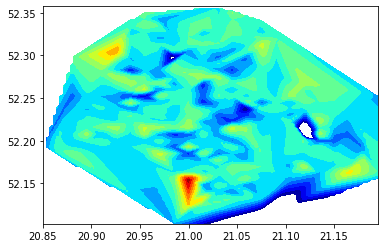

In [426]:
error_geojson, df_error=create_geojson(df_map.lon_mod,df_map.lat_mod,df_map.error,500,-3000)

In [427]:
def plot_geojson_countour(geojson, df, title, zmin, zmax):
    trace = go.Choroplethmapbox(
                                geojson=geojson,
                                locations=df.Id,
                                z=df.value,
                                colorscale="jet",
                                zauto=False,
                                zmin=zmin,
                                zmax=zmax,

                                marker_line_width=0,

                                marker=dict(opacity=0.5),

                               )
    layout = go.Layout(
        title=title,




        height = 800,
        # top, bottom, left and right margins
        margin = dict(t = 80, b = 0, l = 0, r = 0),
        font = dict(color = 'dark grey', size = 18),

        mapbox = dict(


            center = dict(
                lat = center_coors[0],
                lon = center_coors[1]
            ),
            # default level of zoom
            zoom = 11,
            # default map style
            style = "carto-positron"
        )

    )

    figure=dict(
        data=[trace],
        layout=layout,


        )

    iplot(figure)

In [428]:
plot_geojson_countour(error_geojson, df_error,"Error geoanalysis [PLN/m2]",-2000,2000)

It seems we are missing some feature describing cultural life in a given district as geoanalysis shows that the model is underestimating the most in areas which are "popular" with vivid cultural life and overestimating in unpopular districts. To improve the results we will need additional geo data from google dealing with restaurants, museum etc. 

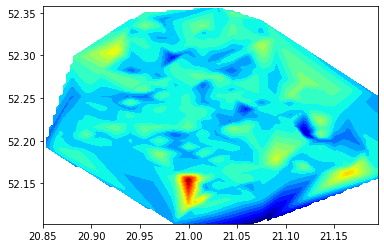

In [433]:
rel_error_geojson, df_rel_error=create_geojson(df_map.lon_mod,df_map.lat_mod,df_map.relative_error,5,-40)

In [435]:
plot_geojson_countour(rel_error_geojson, df_rel_error,"Relative Error geoanalysis [%]",-20,20)